In [1]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc

In [2]:
train = pd.read_csv('train.csv')
test1 = pd.read_csv('test1.csv')
# labels = train['label']
df_train = train.drop(['Unnamed: 0'], axis=1)
df_test = test1.drop(['Unnamed: 0'], axis=1)

In [3]:
df_test["label"]=-1

for col in ["android_id","apptype","carrier","ntt","media_id","cus_type","package",'fea1_hash',"location"]:
    df_train[col]=df_train[col].astype("object")
    df_test[col]=df_test[col].astype("object")

for col in ["fea_hash"]:
    df_train[col]=df_train[col].map(lambda x:0 if len(str(x))>16 else int(x))
    df_test[col]=df_test[col].map(lambda x:0 if len(str(x))>16 else int(x))

for col in ["dev_height","dev_ppi","dev_width","fea_hash","label"]:
    df_train[col]=df_train[col].astype("int64")
    df_test[col]=df_test[col].astype("int64")

df_test["label"]=None

df_train["truetime"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01'))
df_test["truetime"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01'))

df_train["day"]=df_train.truetime.dt.day
df_test["day"]=df_test.truetime.dt.day

df_train["hour"]=df_train.truetime.dt.hour
df_test["hour"]=df_test.truetime.dt.hour

df_train["minute"]=df_train.truetime.dt.minute
df_test["minute"]=df_test.truetime.dt.minute

df_train.set_index("sid",drop=True,inplace=True)
df_test.set_index("sid",drop=True,inplace=True)

In [4]:
df_train.dtypes

android_id            object
apptype               object
carrier               object
dev_height             int64
dev_ppi                int64
dev_width              int64
label                  int64
lan                   object
media_id              object
ntt                   object
os                    object
osv                   object
package               object
timestamp            float64
version               object
fea_hash               int64
location              object
fea1_hash             object
cus_type              object
truetime      datetime64[ns]
day                    int64
hour                   int64
minute                 int64
dtype: object

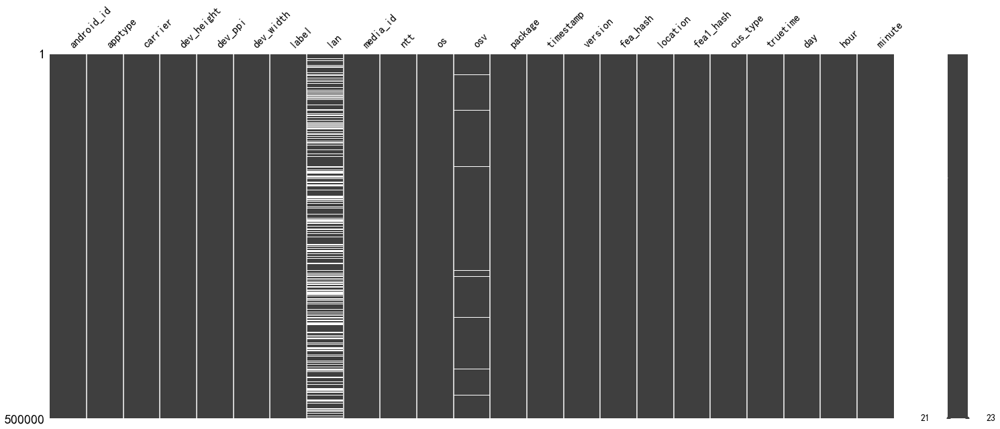

In [5]:
msno.matrix(df_train);

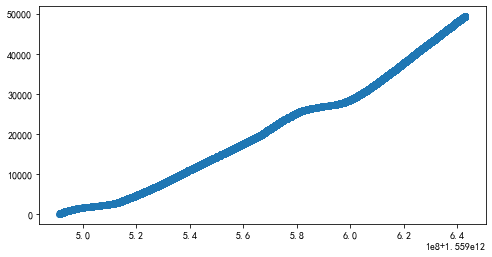

In [66]:
# plt.figure(figsize=(8,4))
# plt.scatter(x=df_train.sort_values(by="timestamp").timestamp[:100000],y=df_train.sort_values(by="timestamp").label[:100000].cumsum());

In [65]:
def summary_stats_table(data):
    '''
    祖传代码：分类型按列的数据分布与异常值统计
    '''
    # 空值数量
    missing_counts = pd.DataFrame(data.isnull().sum())
    missing_counts.columns = ['count_null']

    # 数值列数据分布统计
    num_stats = data.select_dtypes(include=['int64','float64']).describe().loc[['count','min','max','25%','50%','75%']].transpose()
    num_stats['dtype'] = data.select_dtypes(include=['int64','float64']).dtypes.tolist()

    # 非数值列数据分布统计
    non_num_stats = data.select_dtypes(exclude=['int64','float64']).describe().transpose()
    non_num_stats['dtype'] = data.select_dtypes(exclude=['int64','float64']).dtypes.tolist()
    non_num_stats = non_num_stats.rename(columns={"first": "min", "last": "max"})

    # 聚合结果
    stats_merge = pd.concat([num_stats, non_num_stats], axis=0, join='outer', ignore_index=False, keys=None,
              levels=None, names=None, verify_integrity=False, copy=True, sort=False).fillna("").sort_values('dtype')

    column_order = ['dtype', 'count', 'count_null','unique','min','max','25%','50%','75%','top','freq']
    summary_stats = pd.merge(stats_merge, missing_counts, left_index=True, right_index=True, sort=False)[column_order]
    return(summary_stats)
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
dev_height,int64,500000.0,0,,0,9024,720,1280,2040,,
minute,int64,500000.0,0,,0,59,14,29,44,,
hour,int64,500000.0,0,,0,23,5,10,14,,
day,int64,500000.0,0,,2,9,4,6,8,,
truetime,datetime64[ns],500000.0,0,500000,2019-06-02 16:00:01.174781250,2019-06-09 16:00:04.317492432,,,,2019-06-08 16:53:01.408521240,1
dev_width,int64,500000.0,0,,0,8832,360,720,1080,,
dev_ppi,int64,500000.0,0,,0,720,0,0,0,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
fea1_hash,object,500000.0,0,4959,,,,,,4.19076e+09,28393


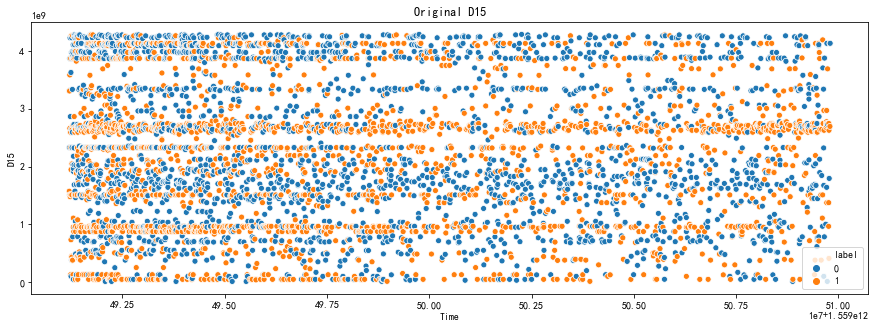

In [80]:
plt.figure(figsize=(15,5))
sns.scatterplot(df_train.sort_values(by="timestamp").timestamp[:5000],df_train.sort_values(by="timestamp").fea1_hash[:5000],hue=df_train.sort_values(by="timestamp").label[:5000])
plt.title('Original D15')
plt.xlabel('Time')
plt.ylabel('D15')
plt.show()

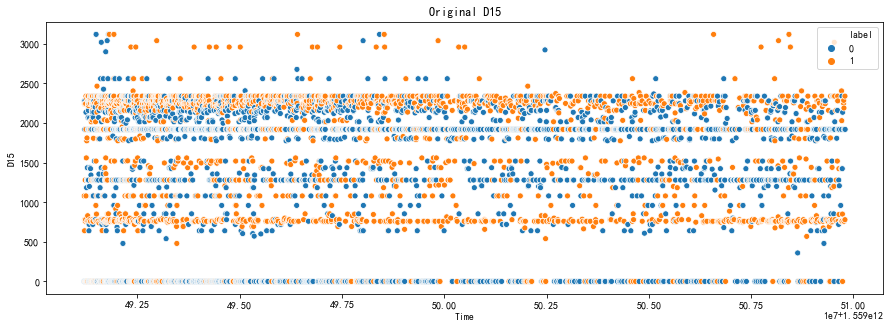

In [82]:
plt.figure(figsize=(15,5))
sns.scatterplot(df_train.sort_values(by="timestamp").timestamp[:5000],df_train.sort_values(by="timestamp").dev_height[:5000],hue=df_train.sort_values(by="timestamp").label[:5000])
plt.title('Original D15')
plt.xlabel('Time')
plt.ylabel('D15')
plt.show()

In [6]:
df_train.groupby(["android_id","ntt"])["label"].agg(["mean","count"]).sort_values(by="count").tail(50)

,,mean,count
android_id,ntt,,
2191,2.0,0.000000,9
33280,2.0,0.000000,9
433396,2.0,0.000000,9
36712,2.0,0.000000,9
17459,2.0,0.111111,9
541334,0.0,0.111111,9
163204,2.0,0.111111,9
89067,6.0,0.000000,9
115566,2.0,0.000000,9


In [135]:
c1=df_train["android_id"]==0
c2=df_train["apptype"]==1001
c3=df_train["media_id"]==29
d=df_train[c1&c2&c3]

In [136]:
d[["timestamp","label","osv","os","dev_height","dev_ppi","dev_width","ntt","package","fea_hash","location","cus_type","fea1_hash"]].sort_values("timestamp").head(50)

,timestamp,label,osv,os,dev_height,dev_ppi,dev_width,ntt,package,fea_hash,location,cus_type,fea1_hash
sid,,,,,,,,,,,,,
1906968,1.559491e+12,1,9.0.0,Android,780,0,360,5,4,4282615925,54,411,2661244967
1954267,1.559491e+12,1,8.1.0,Android,760,0,360,2,4,1069571953,278,411,2594136103
1918927,1.559491e+12,1,8.1.0,Android,760,0,360,2,4,1926710495,266,411,2594136103
1982963,1.559491e+12,1,9.0.0,Android,780,0,360,5,4,1431996533,148,411,2594136103
1960430,1.559491e+12,1,8.1.0,Android,760,0,360,2,4,3676724191,107,411,2644467751
1959551,1.559491e+12,1,9.0.0,Android,830,0,393,2,4,2760295425,137,411,2711576615
1938522,1.559491e+12,1,8.1.0,Android,760,0,360,5,4,1046812452,112,411,2711576615
1924938,1.559491e+12,0,6.0.1,Android,640,0,360,5,4,3558566111,79,411,2728353831
1970635,1.559491e+12,1,8.1.0,Android,760,0,360,2,4,523821948,220,411,2594136103


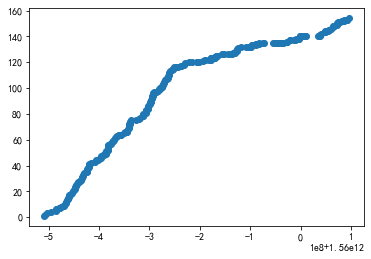

In [125]:
plt.scatter(x=d.sort_values("timestamp").timestamp,y=d.sort_values("timestamp").label.cumsum())

In [137]:
df_train.osv.unique()

array(['9', '8.1', '8.1.0', '8.0.0', '5.1', '9.0.0', '7.1.1', '5.1.1',
       '7.8.7', '4.4.4', nan, '6.0', '6.0.1', '3.9.0', 'Android_8.1.0',
       '7.0', '7.9.2', 'Android_9', '7.9.0', '7.1.2', '3.8.6', '5.1.0',
       '9.0', '7.7.7', '6.0.0', '5.0.2', 'Android_6.0.1', '7.0.0',
       '6.0_23', '4.2.2', '7.1', '8.0', '4.3', 'Android_8.0.0', '4.4.2',
       '4.1', 'Android_7.1.1', '5.0', 'Android_5.1.1', '2.3', '5.0.0',
       '7.8.0', '5.0.1', '4.4', '7.8.6', 'Android_5.1', 'Android_7.1.2',
       'Android_4.4.4', '8.0.1', '3.1.1', '7.7.2', '6.1', '3.8.4',
       '7.8.9', '7.7.5', '7.6.8', 'Android_7.0', '7.8.4', '7', '7.7.3',
       '7.1.0', '9.1', '4.1.1', 'Android_4.4.2', '3.8.0', '6.1.2',
       '7.2.1', '7.6.9', '3.7.8', '7.8.2', '8', '7910', '7.6.4', '7.8.5',
       '2.2.3', '5.2', 'Android_6.0', '4.2.1', '10.3.3', '4.0.2', '7.8.8',
       '4.4.3', '21100', '7.7.0', '4.0.3', '4.0.4', '5', '2.3.6', '6.1.0',
       '21000', '4.3.0', '4.1.2', '4.2', '7.6.7', '9.0.5', '4.4.2_19',


In [172]:
df_train.android_id.unique().__len__()

362258

In [171]:
df_test.android_id.unique().__len__()

110483

In [156]:
df_train.groupby("osv").label.mean().sort_values().head(50)

osv
6.0.1_19                   0.000000
5.3.0-FL2-20180717.9010    0.000000
5.3.0                      0.000000
9.1                        0.000000
Android_4.2.1              0.000000
9.1.0                      0.000000
5.1.1_22                   0.000000
5.1.1-F-20180719.9007      0.000000
2.9.2                      0.000000
Android_4.4.4              0.047059
6.0_23                     0.052632
Android_6.0.1              0.080756
4.3                        0.081148
4.2.2                      0.094758
4.4.4                      0.094798
Android_7.1.1              0.105183
Android_5.0                0.105263
4.3.0                      0.109756
5.0.2                      0.114565
Android_5.0.2              0.115385
5.0                        0.124523
4.2.1                      0.125000
5.1.1                      0.128487
5.0.0                      0.130435
6.0.1                      0.134042
Android_5.1.1              0.138889
Android_4.4.2              0.153846
7.1.1                   

In [159]:
df_train.osv.value_counts().tail(20)

7920                                  1
5.1.1-F-20180719.9007                 1
Android_4.4.3                         1
Android_4.2.1                         1
2.2.2                                 1
8.0.2                                 1
Android 4.2.9                         1
Android 5.12                          1
2.9.2                                 1
2.0.1                                 1
f073b_changxiang_v01_b1b8_20180915    1
5.0_21                                1
9.1                                   1
Android 7.1                           1
4.2.3.2                               1
3.2.0-FL2-20180726.9015               1
9.1.0                                 1
2.3.7                                 1
5.1.1_22                              1
6.1.0-RS-20190305.1125                1
Name: osv, dtype: int64

In [5]:
df_train.version.unique()

array(['8', '4', '0', '5', '9', '7', '3', '1', '6', '11', '2', 'v1', 'V3',
       'GA3', '10', 'P_Final_6', '15', 'V6', ' 2', 'GA2', 'V2', '50'],
      dtype=object)